# Interaktive Visualisierungen mit Plotly

#### Freitag 23.02.24 09:00 – 10:45 Uhr

- Erstellung von Diagrammen und Visualisierungen mit Plotly
- Anpassung von Visualisierungen an die eigenen Bedürfnisse
- Hinzufügen von Animation zur Steigerung der Aussagekraft

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
import plotly.colors as colors

plotly.express: 
* schnelle und einfache Erstellung von interaktiven Plots 
* höhere Abstraktionsebene im Vergleich zu plotly.graph_objects 
* erleichtert die Erstellung von Diagrammen wie Streudiagrammen, Balkendiagrammen, Flächendiagrammen und vielem mehr
* gut, wenn du schnell einfache Visualisierungen erstellen möchtest

plotly.graph_objects: 
* ermöglicht eine detailliertere und umfassendere Kontrolle über die erstellten Diagramme
* Du kannst damit Figuren, Achsen, Traces und Layouts individuell anpassen
* Du kannst komplexere Diagramme erstellen und detaillierte Anpassungen vornehmen

plotly.io: 
* bietet Funktionen zum Speichern und Anzeigen von Plotly-Diagrammen
* ermöglicht beispielsweise das Speichern von Diagrammen als HTML-Dateien, das Anzeigen von Diagrammen in Jupyter Notebooks und vieles mehr

plotly.colors: 
* enthält Funktionen und Konstanten für Farben und Farbskalen in Plotly-Diagrammen
* von vordefinierten Farbpaletten bis hin zu individuell angepassten Farbverläufen

Dokumentation: https://plotly.com/python/

## Los geht's!

In [2]:
ene = pd.read_csv("germany_fossil_renew.csv", sep=";")
ene['Datum'] = pd.to_datetime(ene['Datum'])
ene['Datum'].freq = 'M'
ene.set_index('Datum', inplace=True)

In [3]:
ene.head()

,Fossile,Wind,Solar
Datum,,,
2016-01-01,37521,9771,702
2016-02-01,32023,10371,1350
2016-03-01,35256,6331,2591
2016-04-01,30078,6235,4129
2016-05-01,27404,6445,5190


In [4]:
ene.shape

(58, 3)

<AxesSubplot:xlabel='Datum'>

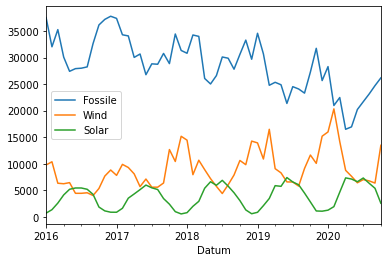

In [5]:
ene.plot()

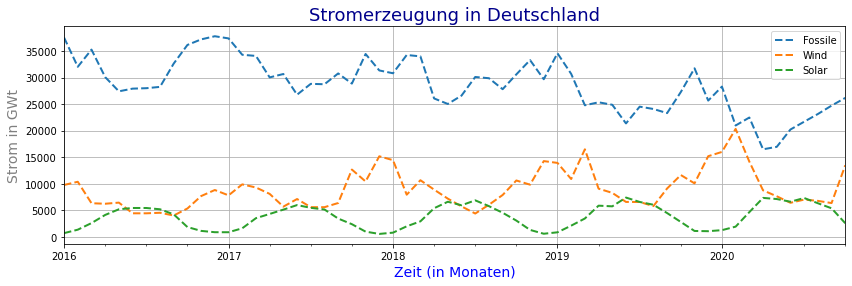

In [6]:
ene.plot(figsize=(14, 4), linewidth=2.0, linestyle='--')
x = plt.xlabel('Zeit (in Monaten)', fontsize=14, color='blue')
y = plt.ylabel('Strom in GWt', fontsize=14, color='grey')
t = plt.title('Stromerzeugung in Deutschland', fontsize=18, color='darkblue')
plt.grid(True)

In [7]:
px.line(ene, x=ene.index, y=['Fossile','Wind','Solar'])

In [8]:
fig = px.line(ene, x=ene.index, y=['Fossile','Wind','Solar'], title='Stromerzeugung in Deutschland nach Energiequelle', labels=dict(Datum="Monatliche Daten", value="Stromerzeugung in Mio. kWh", variable="Energiequelle"))
fig.update_layout(legend=dict(yanchor="top", y=0.95, xanchor="left", x=0.87))
fig.show()

## Interaktivität erhalten

In [9]:
pio.write_image(fig, file='plotly_bild.jpg', format='jpeg')

In [10]:
pio.write_html(fig, file='plotly_bild.html')

## Komplexere Daten

In [11]:
df = pd.read_csv("World Energy Consumption.csv")
df.head()

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_elec_per_capita,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita
0,AFG,Afghanistan,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,Afghanistan,1901,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,Afghanistan,1902,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,AFG,Afghanistan,1903,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,AFG,Afghanistan,1904,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
df.shape

(17432, 122)

<AxesSubplot:>

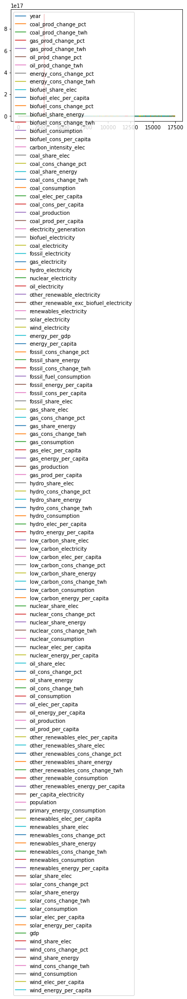

In [13]:
df.plot()

In [14]:
countries = df['country'].unique()
years = df['year'].unique()

print("Countries:")
print(countries)

print("\nYears:")
print(years)

col = df.columns
col_in_one_line = ', '.join(col)
print("\nColumns:")
print(col_in_one_line)

Countries:
['Afghanistan' 'Africa' 'Albania' 'Algeria' 'American Samoa' 'Angola'
 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba' 'Asia Pacific'
 'Australia' 'Austria' 'Azerbaijan' 'Bahamas' 'Bahrain' 'Bangladesh'
 'Barbados' 'Belarus' 'Belgium' 'Belize' 'Benin' 'Bermuda' 'Bhutan'
 'Bolivia' 'Bosnia and Herzegovina' 'Botswana' 'Brazil'
 'British Virgin Islands' 'Brunei' 'Bulgaria' 'Burkina Faso' 'Burundi'
 'CIS' 'Cambodia' 'Cameroon' 'Canada' 'Cape Verde' 'Cayman Islands'
 'Central African Republic' 'Central America' 'Chad' 'Chile' 'China'
 'Colombia' 'Comoros' 'Congo' 'Cook Islands' 'Costa Rica' "Cote d'Ivoire"
 'Croatia' 'Cuba' 'Cyprus' 'Czechia' 'Czechoslovakia'
 'Democratic Republic of Congo' 'Denmark' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Eastern Africa' 'Ecuador' 'Egypt' 'El Salvador'
 'Equatorial Guinea' 'Eritrea' 'Estonia' 'Eswatini' 'Ethiopia' 'Europe'
 'Europe (other)' 'Faeroe Islands' 'Falkland Islands ' 'Fiji' 'Finland'
 'France' 'French Guiana' 'French Polynesia

In [15]:
gapminder = px.data.gapminder()
gapminder = gapminder.rename(columns={'iso_alpha': 'iso_code'})
cont = gapminder[['iso_code', 'continent']]
cont = cont.drop_duplicates()
cont.head()

,iso_code,continent
0,AFG,Asia
12,ALB,Europe
24,DZA,Africa
36,AGO,Africa
48,ARG,Americas


In [16]:
dfc = pd.merge(df, cont, on='iso_code')
dfc = dfc.dropna(subset=["continent"])
dfc.shape

(12052, 123)

In [17]:
dfc.head()

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita,continent
0,AFG,Afghanistan,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Asia
1,AFG,Afghanistan,1901,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Asia
2,AFG,Afghanistan,1902,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Asia
3,AFG,Afghanistan,1903,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Asia
4,AFG,Afghanistan,1904,NaN,0.0,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Asia


In [18]:
fig = px.line(dfc, x="year", y="oil_consumption")
fig.show()

In [19]:
fig = px.line(dfc, x="year", y="oil_consumption", color="continent", hover_name='country')
fig.update_layout(xaxis=dict(range=[1964, 2020]))
fig.show()

In [20]:
fig = px.line(dfc, x="year", y="oil_consumption", color="continent", hover_name='country', title = "Oil Consumption by Country (and Continent)", labels=dict(year="Year", oil_consumption="Oil Consumption (in Einheit)", continent="Continent"))
fig.update_layout(xaxis=dict(range=[1964, 2020]))
fig.show()

In [21]:
fig = px.line(dfc, x="year", y="oil_consumption", color="continent", hover_name='country', width=800, height=500)

fig.update_layout(
    xaxis=dict(
        range=[1964, 2020],
        title='Year'
    ),
    yaxis=dict(
        title='Oil Consumption (in million barrels per day)'  
    ),
    title='Oil Consumption by Country (and Continent)',  
    legend=dict(
        title='Continent',  
        orientation='h', 
        yanchor='bottom',  
        y=1.02 
    ),
    margin=dict(t=100) 
)

<div class="alert alert-info">
    <h5> Aufgaben 1.1  </h5><br>
- Plotte Liniendiagramme von einer anderen Variable, die dich interessiert aus dem Datensatz<br>
- Passe den Plot so an, dass der Betrachter möglichst gleich erkennt, was hier abgebildet ist<br>
</div>

### Legendonly

In [22]:
fig = px.line(dfc, x="year", y="oil_consumption", color="continent", hover_name='country')

fig.update_layout(
    xaxis=dict(
        range=[1964, 2020],
        title='Year'
    ),
    yaxis=dict(
        title='Oil Consumption (in million barrels per day)'  
    ),
    title='Oil Consumption by Country (and Continent)',  
    legend=dict(
        title='Continent',  
        orientation='h', 
        yanchor='bottom',  
        y=1.02 
    ),
    margin=dict(t=100) 
)

fig.update_traces(showlegend=True, legendgroup='continent', 
                  visible="legendonly", selector=dict(name='Asia'))
fig.show()

In [23]:
fig = px.line(dfc, x="year", y="oil_consumption", color="continent", hover_name='country')

fig.update_layout(
    xaxis=dict(
        range=[1964, 2020],
        title='Year'
    ),
    yaxis=dict(
        title='Oil Consumption (in million barrels per day)'  
    ),
    title='Oil Consumption by Country (and Continent)',  
    legend=dict(
        title='Continent'
    ),
    margin=dict(t=90) 
)

continents_to_legendonly = ['Asia', 'Americas', 'Africa', 'Oceania']

for continent in continents_to_legendonly:
    fig.update_traces(showlegend=True, legendgroup='continent',
                      visible="legendonly", selector=dict(name=continent))

fig.show()

### Hovertemplates & Annotation

In [24]:
fig = px.line(dfc, x="year", y="oil_consumption", color="continent", hover_name='country')

fig.update_traces(hovertemplate='<b>%{hovertext}</b><br>Year: %{x}<br>Oil Consumption: %{y} million barrels per day')

fig.add_annotation(
    x=2004,
    y=11500,
    text="Highest Consumption",
    showarrow=True,
    arrowhead=1,
    arrowcolor="black"
)

fig.update_traces(
    line=dict(color='royalblue', width=6),
    marker=dict(symbol='circle', size=6),
    selector=dict(name='Asia')  
)

fig.update_layout(
    xaxis=dict(
        range=[1964, 2020],
        title='Year'
    ),
    yaxis=dict(
        title='Oil Consumption (in million barrels per day)'
    ),
    title='Oil Consumption by Country (and Continent)',
    legend=dict(
        title='Continent',
        orientation='h',
        yanchor='top',
        y=-0.2,
        xanchor='left',
        x=0.2
    ),
    margin=dict(t=100)
)

fig.show()

## Bar Charts & Farben

In [25]:
german_data = dfc[dfc['country'] == 'Germany']
german_data.head()

,iso_code,country,year,coal_prod_change_pct,coal_prod_change_twh,gas_prod_change_pct,gas_prod_change_twh,oil_prod_change_pct,oil_prod_change_twh,energy_cons_change_pct,...,solar_energy_per_capita,gdp,wind_share_elec,wind_cons_change_pct,wind_share_energy,wind_cons_change_twh,wind_consumption,wind_elec_per_capita,wind_energy_per_capita,continent
4327,DEU,Germany,1900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,2.500000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe
4328,DEU,Germany,1901,0.941,6.095,NaN,0.0,-12.000,-0.070,NaN,...,NaN,2.450000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe
4329,DEU,Germany,1902,-1.329,-8.683,NaN,0.0,13.636,0.070,NaN,...,NaN,2.520000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe
4330,DEU,Germany,1903,8.149,52.546,NaN,0.0,26.000,0.151,NaN,...,NaN,2.670000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe
4331,DEU,Germany,1904,3.999,27.887,NaN,0.0,42.857,0.314,NaN,...,NaN,2.790000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Europe


In [26]:
fig = px.bar(
    german_data,
    x='year',
    y=['coal_electricity', 'gas_electricity', 'oil_electricity', 'nuclear_electricity',
       'hydro_electricity', 'solar_electricity', 'wind_electricity', 'other_renewable_electricity'],
    title='Electricity Generation in Germany by Energy Source',
    labels={'value': 'Electricity Generation (TWh)', 'variable': 'Energy Source'},
    color_discrete_sequence=px.colors.qualitative.Pastel
)

fig.update_layout(
    xaxis=dict(title='Year', range=[1984, 2021]),
    yaxis=dict(title='Electricity Generation (TWh)'),
    legend=dict(title='Energy Source'),
    barmode='stack'
)

fig.show()

In [27]:
categorical_color_scales = dir(colors.qualitative)
cats_in_one_line = ', '.join([color_scale for color_scale in categorical_color_scales if not color_scale.startswith("_")])
print(cats_in_one_line)

Alphabet, Alphabet_r, Antique, Antique_r, Bold, Bold_r, D3, D3_r, Dark2, Dark24, Dark24_r, Dark2_r, G10, G10_r, Light24, Light24_r, Pastel, Pastel1, Pastel1_r, Pastel2, Pastel2_r, Pastel_r, Plotly, Plotly_r, Prism, Prism_r, Safe, Safe_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, T10, T10_r, Vivid, Vivid_r, swatches


In [28]:
fig = px.bar(
    german_data,
    x='year',
    y='renewables_electricity',  
    color='nuclear_electricity', 
    title='Renewables Electricity Generation and Nuclear Electricity in Germany',
    labels={'renewables_electricity': 'Renewables Electricity Generation (TWh)', 'nuclear_electricity': 'Nuclear Electricity Generation (TWh)'},
    color_continuous_scale='burg'
)

fig.update_layout(
    xaxis=dict(title='Year', range=[1984,2021]),
    yaxis=dict(title='Renewables Electricity Generation (TWh)'),
    coloraxis_colorbar=dict(title='Nuclear Electricity')
)

fig.show()

In [29]:
named_colorscales = px.colors.named_colorscales()
names_in_one_line = ', '.join(named_colorscales)
print(names_in_one_line)

aggrnyl, agsunset, blackbody, bluered, blues, blugrn, bluyl, brwnyl, bugn, bupu, burg, burgyl, cividis, darkmint, electric, emrld, gnbu, greens, greys, hot, inferno, jet, magenta, magma, mint, orrd, oranges, oryel, peach, pinkyl, plasma, plotly3, pubu, pubugn, purd, purp, purples, purpor, rainbow, rdbu, rdpu, redor, reds, sunset, sunsetdark, teal, tealgrn, turbo, viridis, ylgn, ylgnbu, ylorbr, ylorrd, algae, amp, deep, dense, gray, haline, ice, matter, solar, speed, tempo, thermal, turbid, armyrose, brbg, earth, fall, geyser, prgn, piyg, picnic, portland, puor, rdgy, rdylbu, rdylgn, spectral, tealrose, temps, tropic, balance, curl, delta, oxy, edge, hsv, icefire, phase, twilight, mrybm, mygbm


Um die Farbgebung umzukehren, können die Farbschemata auch "reversed" genutzt werden (z.B. "bluered_r")

<div class="alert alert-info">
    <h5> Aufgaben 1.2  </h5><br>
- Füge zu deinem Linechart von vorhin noch die Funktionalität hinzu, dass einzelne Legendeneinträge nur ausgegraut erscheinen und die entsprechenden Traces nicht im Plot zu sehen sind.<br>    
- Erstelle einen anderen Barchart aus der Daten des Dataframes und passe die Farbgebung an<br>
</div>

## Scatterplots und Animation

In [30]:
dfcp = dfc.dropna(subset=["population","gdp"])
dfcp = dfcp.sort_values('year')

In [31]:
dfcp2016 = dfcp[dfcp["year"]==2016]

In [32]:
dfcp2016.renewables_consumption.info()

<class 'pandas.core.series.Series'>
Int64Index: 136 entries, 8391 to 12048
Series name: renewables_consumption
Non-Null Count  Dtype  
--------------  -----  
64 non-null     float64
dtypes: float64(1)
memory usage: 2.1 KB


In [33]:
dfcp2016_cleaned = dfcp2016.dropna(subset=['renewables_consumption'])
dfcp2016_cleaned.shape

(64, 123)

In [34]:
fig = px.scatter(dfcp2016_cleaned, x='gdp', y='energy_per_capita', color='continent', hover_name='country')
fig.show()

In [35]:
fig = px.scatter(dfcp2016_cleaned, 
                 x='gdp', 
                 y='energy_per_capita', 
                 color='continent', 
                 size='population', 
                 size_max=40, 
                 hover_name='country', 
                 range_x=[90000000000, 30000000000000], 
                 range_y=[0,120000],
                 title = 'Energy per Capita and GDP for Different Countries in 2016', 
                 labels=dict(population="Population", gdp="GDP", energy_per_capita="Energy per Capita", continent="Continent")
                )
fig.show()

In [36]:
dfcp_1965 = dfcp[dfcp['year'] >= 1965]

In [37]:
dfcp_1965_sorted = dfcp_1965.sort_values('oil_consumption')
dfcp_1965_sorted = dfcp_1965_sorted.dropna(subset=["oil_consumption"])
dfcp_1965_sorted.oil_consumption.head()

8461     5.292
10175    5.484
8462     5.520
5145     5.612
10176    5.617
Name: oil_consumption, dtype: float64

In [38]:
fig = px.scatter(dfcp_1965_sorted, 
                 x='gdp', 
                 y='energy_per_capita', 
                 log_x=True, 
                 color='continent', 
                 size='population', 
                 size_max=40, 
                 hover_name='country', 
                 animation_frame='year',
                 range_x=[9e10, 3e13], 
                 range_y=[0,120000],
                 title = 'Energy per Capita and GDP for Different Countries Over Time', 
                 labels=dict(population="Population", gdp="GDP", energy_per_capita="Energy per Capita", continent="Continent")
                )
fig.show()

In [39]:
fig = px.scatter(dfcp_1965_sorted, 
                 x='gdp', 
                 y='energy_per_capita', 
                 log_x=True, 
                 color='continent', 
                 size='population', 
                 size_max=40, 
                 hover_name='country', 
                 animation_group='year',
                 range_x=[9e10, 3e13], 
                 range_y=[0,120000],
                 title = 'Energy per Capita and GDP for Different Countries Over Time', 
                 labels=dict(population="Population", gdp="GDP", energy_per_capita="Energy per Capita", continent="Continent")
                )
fig.show()

In [40]:
pio.templates

Templates configuration
-----------------------
    Default template: 'plotly'
    Available templates:
        ['ggplot2', 'seaborn', 'simple_white', 'plotly',
         'plotly_white', 'plotly_dark', 'presentation', 'xgridoff',
         'ygridoff', 'gridon', 'none']

In [41]:
fig = px.scatter(dfcp_1965, 
                 x='gdp', 
                 y='energy_per_capita', 
                 log_x=True, 
                 color='continent', 
                 size='population', 
                 size_max=40, 
                 hover_name='country', 
                 animation_frame='year',
                 animation_group='country',
                 template='presentation', 
                 color_continuous_scale='rdylgn_r',
                 range_x=[9e10, 3e13], 
                 range_y=[0,120000],
                 title = 'Energy per Capita and GDP for Different Countries Over Time', 
                 labels=dict(population="Population", gdp="GDP", energy_per_capita="Energy per Capita", continent="Continent")
                )
fig.show()

<div class="alert alert-info">
    <h5> Aufgaben 1.3  </h5><br>
- Erstelle einen Scatterplot aus anderen Daten des Datensatzes<br>
- Füge eine Animation hinzu<br>
</div>